# Môn: Phân tích xử lý ảnh
* Sinh viên: Huỳnh Thị Bảo Trân
* MSSV: 19110482
* Bài thực hành: Lab01 - Basic Color And Gray Image Processing

## Các thư viện được sử dụng

In [1]:
import cv2
import numpy as np
import pandas as pd
from pylab import imread
from matplotlib import pyplot as plt
from skimage import data, exposure, feature
from skimage.color import rgb2gray
from skimage.morphology import disk
from skimage.filters.rank import median

## Các hàm được sử dụng

In [2]:
def imShows(ImageData, LabelData, rows, cols, gridType = False):
    ImageArray = list(ImageData)
    LabelArray = list(LabelData)
    if(rows == 1 & cols == 1):
        fig = plt.figure(figsize = (20, 20))
    else:
        fig = plt.figure(figsize = (cols * 8, rows * 5))
    
    for i in range(1, cols * rows + 1):
        fig.add_subplot(rows, cols, i)
        image = ImageArray[i - 1]
        if (len(image.shape) < 3):
            plt.imshow(image, plt.cm.gray)
            plt.grid(gridType)
        else:
            plt.imshow(image)
            plt.grid(gridType)
        plt.title(LabelArray[i - 1])
    
    plt.show()

In [3]:
def showListImages(listImage, row, col):
    listCaption = []
    for i in range(len(listImage)):
        listCaption.append(str(i))
        
    imShows(listImage, listCaption, row, col)

In [4]:
def histogramEqualize(img):
    r, g, b = cv2.split(img)
    red = cv2.equalizeHist(r)
    green = cv2.equalizeHist(g)
    blue = cv2.equalizeHist(b)
    return cv2.merge((red, green, blue))

In [5]:
def segmentColorImageByMask(img, Mask):
    Mask = Mask.astype(np.uint8)
    result = cv2.bitwise_and(img, img, mask = Mask)
    return result

In [6]:
def pixelValTransformation(pix, r1, s1, r2, s2):
    if (0 <= pix and pix <= r1):
        return (s1 / r1) * pix
    elif (r1 < pix and pix <= r2):
        return ((s2 - s1)/(r2 - r1)) * (pix - r1) + s1
    else:
        return ((255 - s2)/(255 - r2)) * (pix - r2) + s2

## Yêu cầu 1: Chọn ảnh từ internet bất kỳ và thực hiện:

**0. Đọc ảnh**

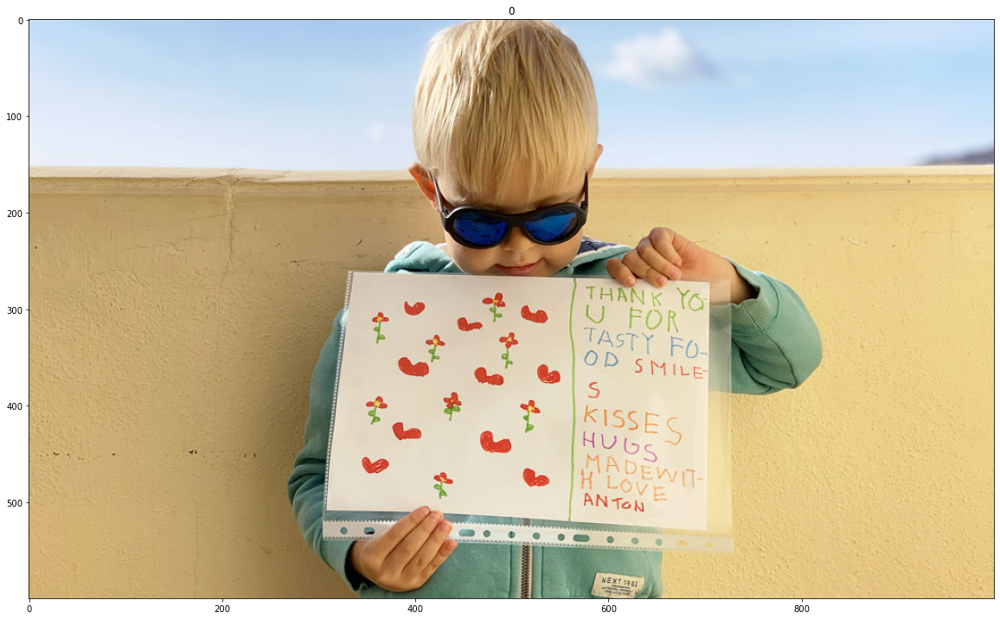

In [7]:
# Read Image 
image_color = imread('drawing.jpg')

# Display Image
showListImages([image_color], 1, 1)

**1. Tạo ảnh grayscale**

In [8]:
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

**1.1 Show ảnh grayscale**

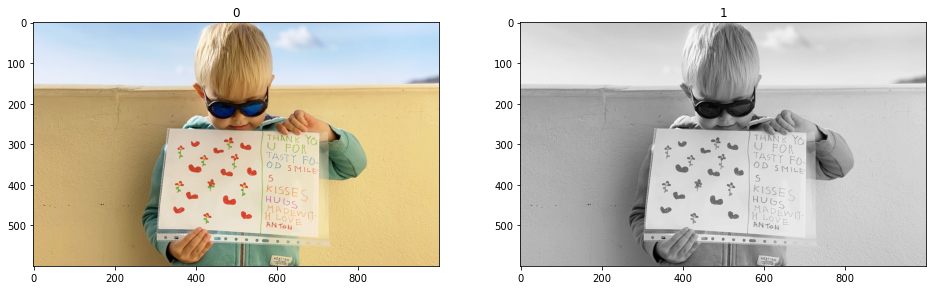

In [9]:
# Display Image
showListImages([image_color, image_gray], 1, 2)

**2. Tạo ảnh hsv**

In [10]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_BGR2HSV)

**2.1 Show các kênh hue, saturation và value**

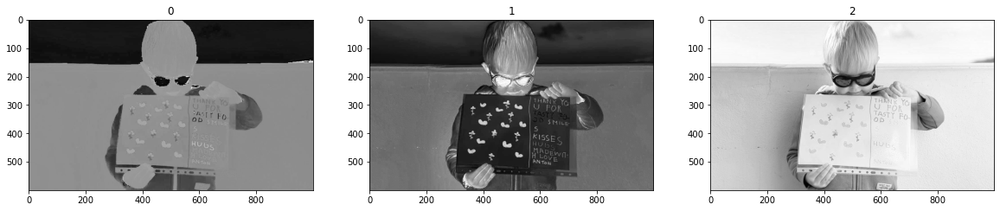

In [11]:
# Show each channel H , S and V
showListImages([image_hsv[:, :, 0], image_hsv[:, :, 1], image_hsv[:, :, 2]], 1, 3)

**2.2 Show các kênh red, green và blue**

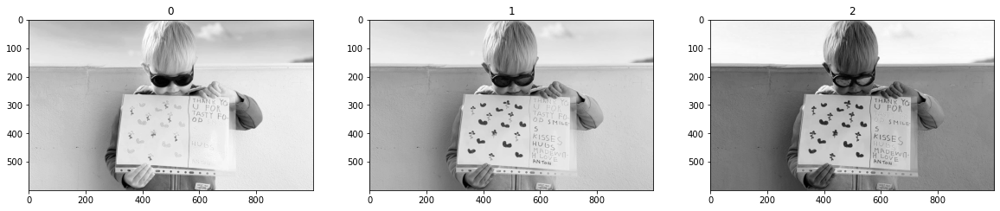

In [12]:
# Show each channel R, G, and B
showListImages([image_color[:, :, 0], image_color[:, :, 1], image_color[:, :, 2]], 1, 3)

**3. Chọn ngưỡng hue để trích xuất đối tượng chủ đạo trong ảnh (hiển thị ảnh màu đối tượng sau khi trích xuất)**

In [13]:
hue_img = image_hsv[:, :, 0]
hue_threshold = 50

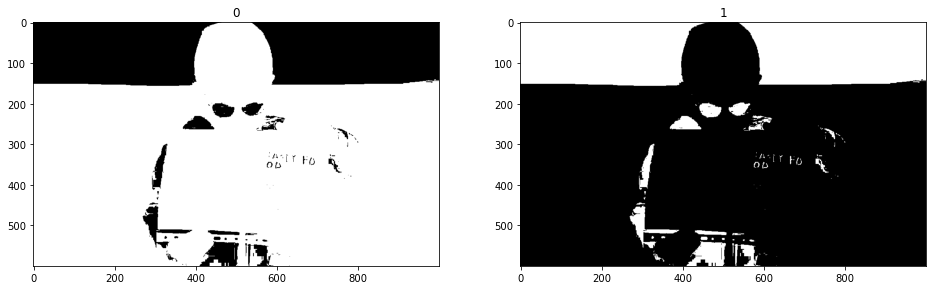

In [14]:
# Use threshold to segment object by histogram
hue_binary01 = hue_img > hue_threshold
hue_binary02 = 1 - hue_binary01

showListImages([hue_binary01, hue_binary02], 1, 2)

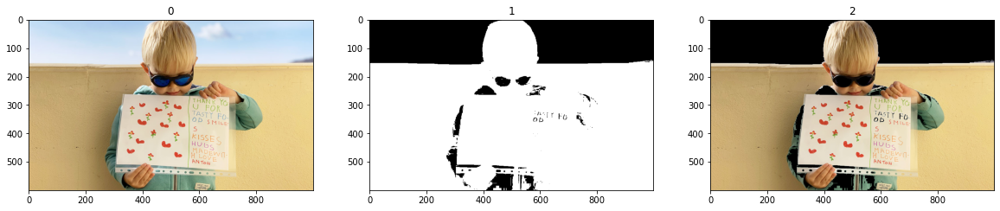

In [15]:
hue_binary01_rgb = segmentColorImageByMask(image_color, hue_binary01)
showListImages([image_color, hue_binary01, hue_binary01_rgb], 1, 3)

**4. Hiển thị histogram của 3 kênh màu h, s, v**

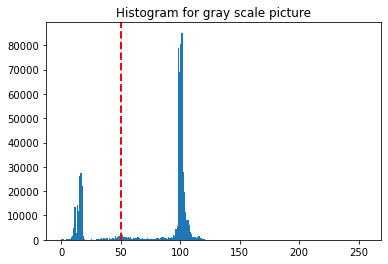

In [16]:
# Show Histogram of Hue Channel
hist = cv2.calcHist([hue_img], [0], None, [256], [0, 256])
plt.hist(hue_img.ravel(), 256, [0, 256])
plt.axvline(x = hue_threshold, color = 'r', linestyle = 'dashed', linewidth = 2)
plt.title('Histogram for gray scale picture')
plt.show()

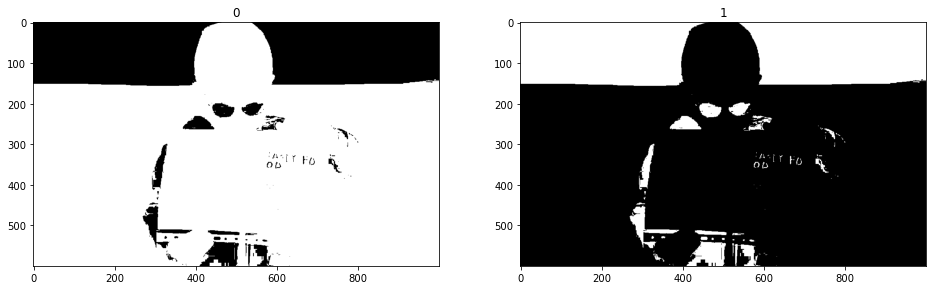

In [17]:
# Use threshold to segment object by histogram
hue_binary01 = hue_img > hue_threshold
hue_binary02 = 1 - hue_binary01

showListImages([hue_binary01, hue_binary02], 1, 2)

**4.1 Hiển thị histogram của 3 kênh r, g, b**

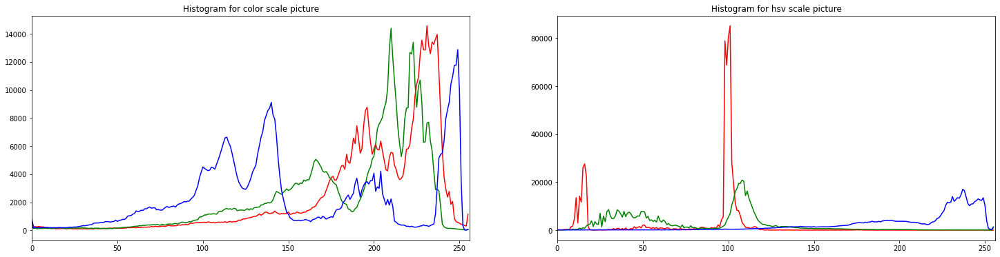

In [18]:
plt.figure(figsize = (25, 6))

plt.subplot(1, 2, 1)
color = ('r', 'g', 'b')
for channel, col in enumerate(color):
    histr = cv2.calcHist([image_color], [channel], None, [256], [0, 256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256])
plt.title('Histogram for color scale picture')

plt.subplot(1, 2, 2)
color = ('r', 'g', 'b')
for channel,col in enumerate(color):
    histr = cv2.calcHist([image_hsv], [channel], None, [256], [0, 256])
    plt.plot(histr, color = col)
    plt.xlim([0, 256])
plt.title('Histogram for hsv scale picture')

plt.show()

## Yêu cầu 2: Chọn một ảnh khác từ internet bất kỳ và thực hiện các bước sau:

**0. Đọc ảnh**

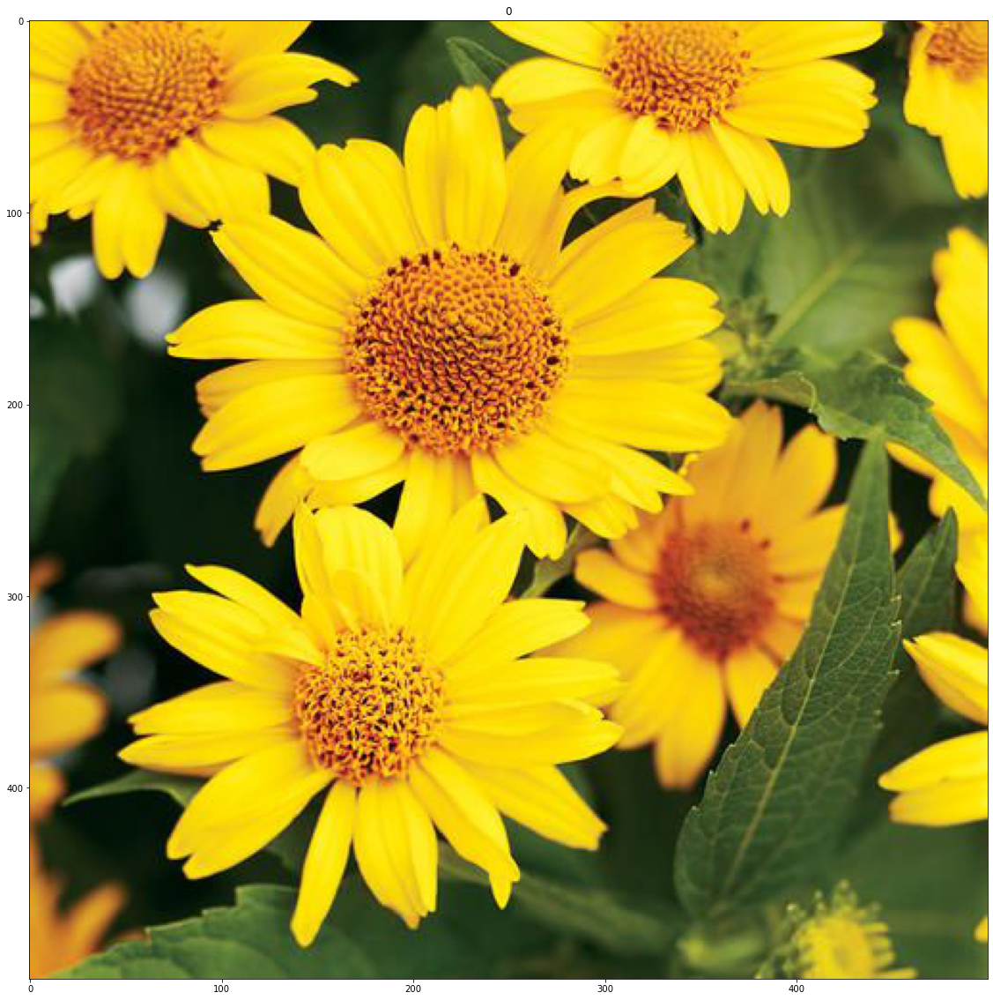

In [19]:
# Read Image 
image_color = imread('flower01.jpg')

# Display Image
showListImages([image_color], 1, 1)

**1. Tạo ảnh xám từ ảnh màu**

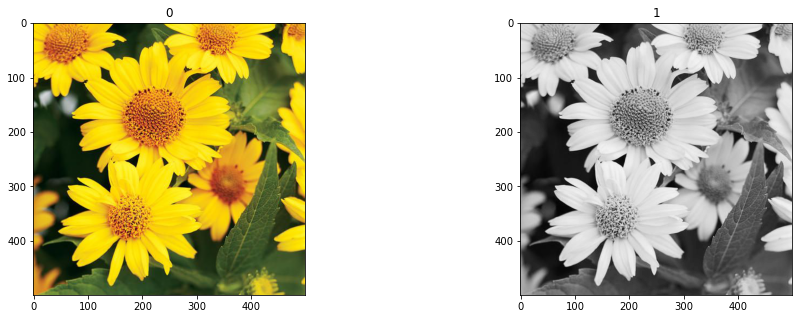

In [20]:
# Convert Image into Gray
image_gray = cv2.cvtColor(image_color, cv2.COLOR_RGB2GRAY)

# Display Image
showListImages([image_color, image_gray], 1, 2)

**2. Làm mờ ảnh**

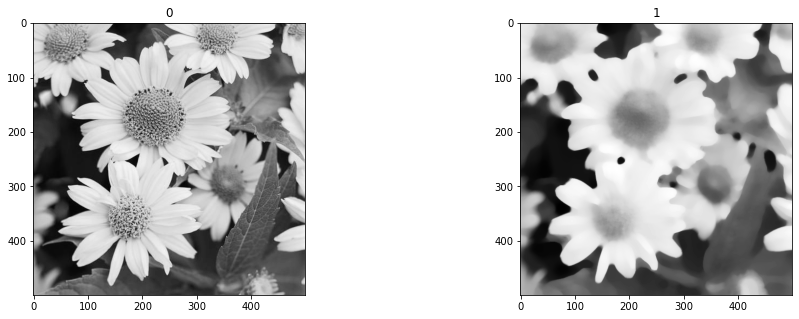

In [21]:
# Create Blurred Image
image_blurred = median(image_gray, disk(10))
showListImages([image_gray, image_blurred], 1, 2)

**3. Làm nhiễu ảnh**

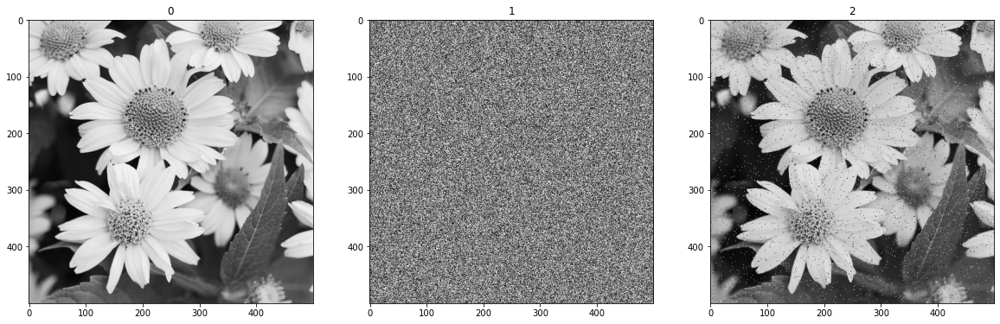

In [22]:
# Create Noise Image
noise = np.random.random(image_gray.shape)
image_noise = image_gray.copy()
image_noise[noise > 0.99] = 255
image_noise[noise < 0.01] = 0

showListImages([image_gray, noise, image_noise], 1, 3)

**4. Hiển thị histogram của ảnh xám và cân bằng histogram, hiển thị ảnh sau khi cân bằng**

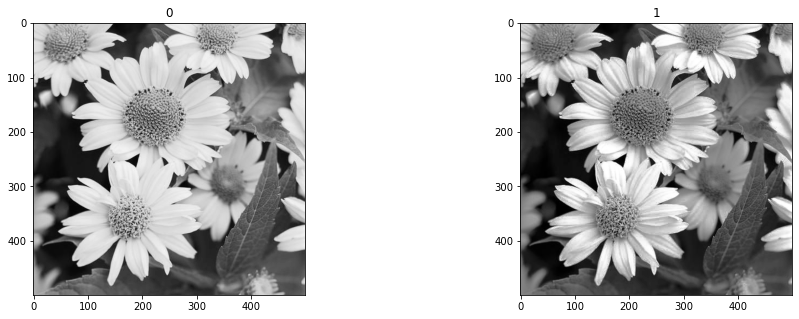

In [23]:
image_equalization = exposure.equalize_hist(image_gray)
image_equalization = np.float32(image_equalization * 255)
showListImages([image_gray, image_equalization], 1, 2)

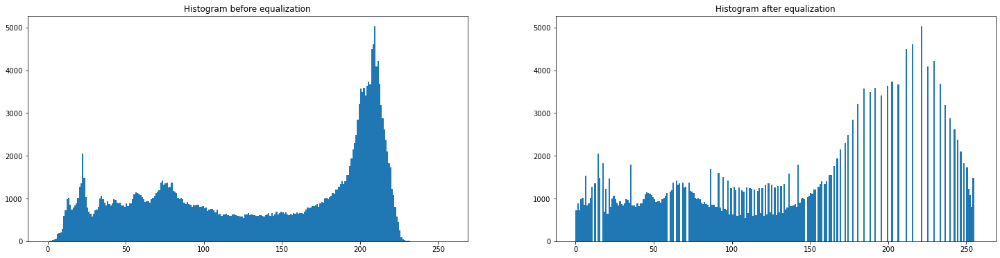

In [24]:
plt.figure(figsize = (25, 6))

plt.subplot(1, 2, 1)
hist = cv2.calcHist([image_gray], [0], None, [256], [0, 256])
plt.hist(image_gray.ravel(), 256, [0, 256])
plt.title('Histogram before equalization')

plt.subplot(1, 2, 2)
hist = cv2.calcHist([image_equalization], [0], None, [256], [0, 256])
plt.hist(image_equalization.ravel(), 256, [0, 256])
plt.title('Histogram after equalization')

plt.show()

**5. Cân bằng 3 kênh màu hsv cùng lúc và hiển thị ảnh kết quả sau khi cân bằng**

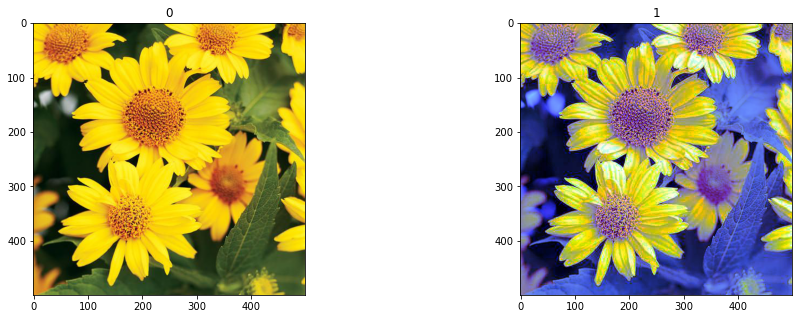

In [25]:
image_equalization_color = histogramEqualize(image_color)
showListImages([image_color, image_equalization_color], 1, 2)

**6. Enhance ảnh bằng cách cân bằng histogram kênh s và v**

In [26]:
# Convert Image into HSV color spaces
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)
# Apply histogram equalization
channel = 1
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])
channel = 2
image_hsv[:, :, channel] = cv2.equalizeHist(image_hsv[:, :, channel])

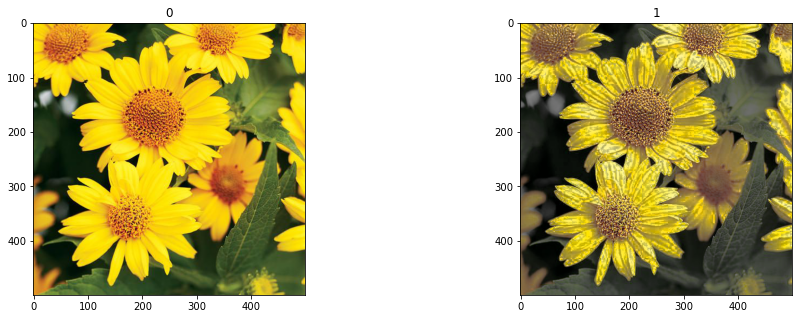

In [27]:
# Convert to RGB
image_enhanced = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)
showListImages([image_color, image_enhanced], 1, 2)

**7. Thực hiện các biến đổi gamma**

In [28]:
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)
img = image_hsv[:, :, 2]
gamma = [0.1, 0.4, 1.0, 1.5, 2.5]
gamma_corrected_01 = np.array(255 * (img / 255) ** gamma[0], dtype = 'uint8') 
gamma_corrected_02 = np.array(255 * (img / 255) ** gamma[1], dtype = 'uint8') 
gamma_corrected_03 = np.array(255 * (img / 255) ** gamma[2], dtype = 'uint8') 
gamma_corrected_04 = np.array(255 * (img / 255) ** gamma[3], dtype = 'uint8')
gamma_corrected_05 = np.array(255 * (img / 255) ** gamma[4], dtype = 'uint8')

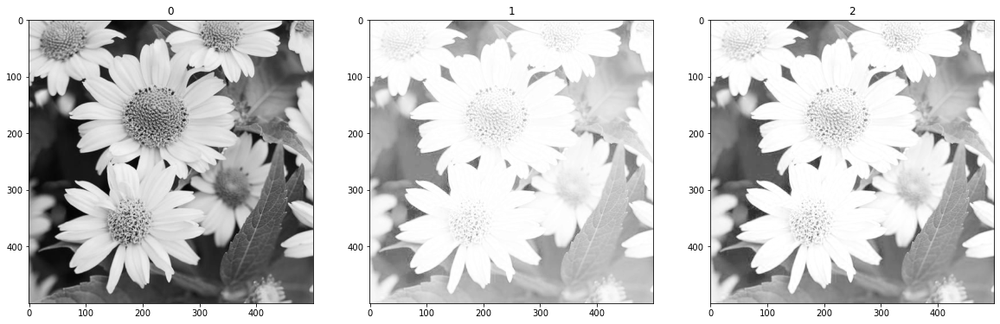

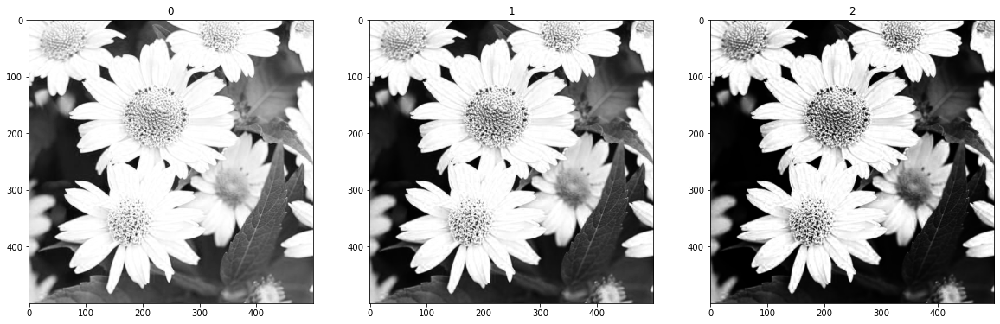

In [29]:
showListImages([image_gray, gamma_corrected_01, gamma_corrected_02], 1, 3)
showListImages([gamma_corrected_03, gamma_corrected_04, gamma_corrected_05], 1, 3)

In [30]:
channel = 2
image_hsv_01 = image_hsv.copy()
image_hsv_01[:, :, 2] = gamma_corrected_01
image_enhanced_01 = cv2.cvtColor(image_hsv_01, cv2.COLOR_HSV2RGB)
image_hsv_02 = image_hsv.copy()
image_hsv_02[:, :, 2] = gamma_corrected_02
image_enhanced_02 = cv2.cvtColor(image_hsv_02, cv2.COLOR_HSV2RGB)
image_hsv_03 = image_hsv.copy()
image_hsv_03[:, :, 2] = gamma_corrected_03
image_enhanced_03 = cv2.cvtColor(image_hsv_03, cv2.COLOR_HSV2RGB)
image_hsv_04 = image_hsv.copy()
image_hsv_04[:, :, 2] = gamma_corrected_04
image_enhanced_04 = cv2.cvtColor(image_hsv_04, cv2.COLOR_HSV2RGB)
image_hsv_05 = image_hsv.copy()
image_hsv_05[:, :, 2] = gamma_corrected_05
image_enhanced_05 = cv2.cvtColor(image_hsv_05, cv2.COLOR_HSV2RGB)

**7.1 Hiển thị ảnh màu tương ứng**

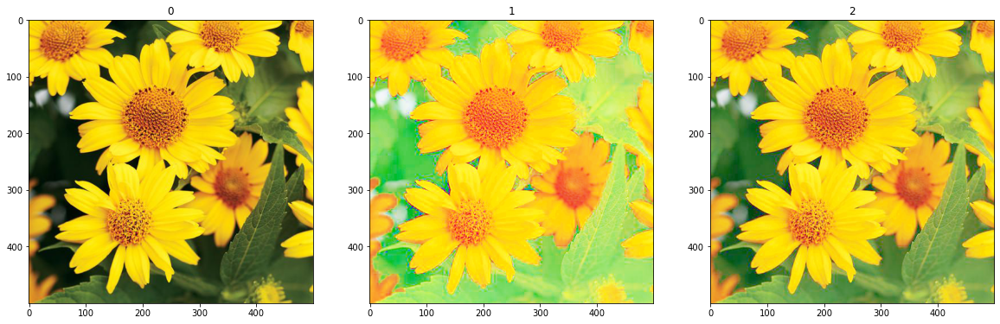

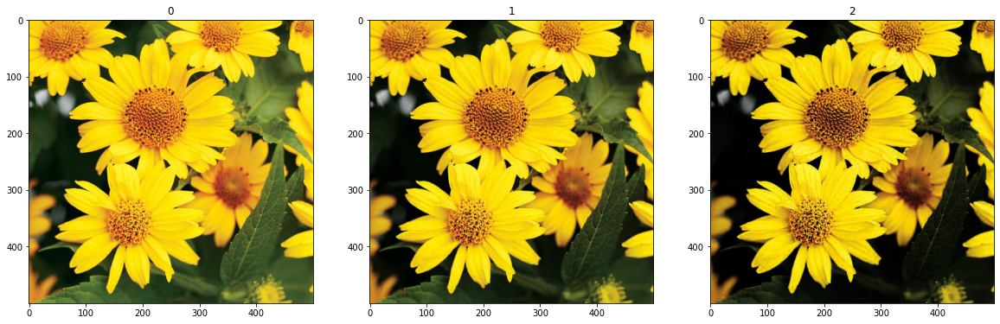

In [31]:
showListImages([image_color, image_enhanced_01, image_enhanced_02], 1, 3)
showListImages([image_enhanced_03, image_enhanced_04, image_enhanced_05], 1, 3)

**8. Chọn ngưỡng mức tối và ngưỡng mức sáng mà ở đó dưới mức tối sẽ cho tối hơn và trên mức sáng sẽ cho sáng hơn trên kênh màu value trong hsv**

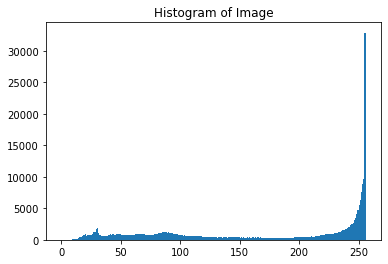

In [32]:
image_hsv = cv2.cvtColor(image_color, cv2.COLOR_RGB2HSV)
image_hsv_value = image_hsv[:, :, 2]

hist = cv2.calcHist([image_hsv_value], [0], None, [256], [0, 256])
plt.hist(image_hsv_value.ravel(), 256, [0, 256])
plt.title('Histogram of Image')
plt.show()

# Define parameters. 
r1 = 50
s1 = 0
r2 = 200
s2 = 255

# Vectorize the function to apply it to each value in the Numpy array. 
pixelVal_vec = np.vectorize(pixelValTransformation) 
# Apply contrast stretching. 
contrast_stretched = pixelVal_vec(image_hsv_value, r1, s1, r2, s2) 

image_hsv[:, :, 2] = contrast_stretched
image_enhanced = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2RGB)

**8.1 Sau đó hiển thị ảnh kết quả sau khi enhance**

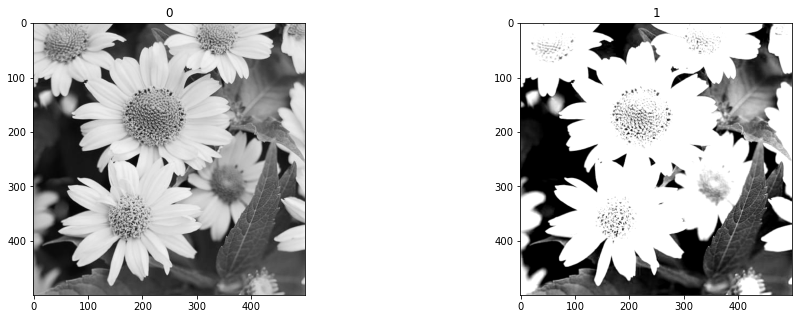

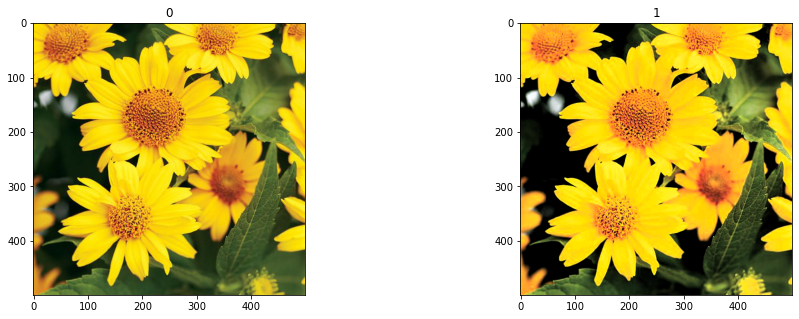

In [33]:
showListImages([image_gray, contrast_stretched], 1, 2)
showListImages([image_color, image_enhanced], 1, 2)

**9. Xuất ảnh biên/cạnh của ảnh gốc**

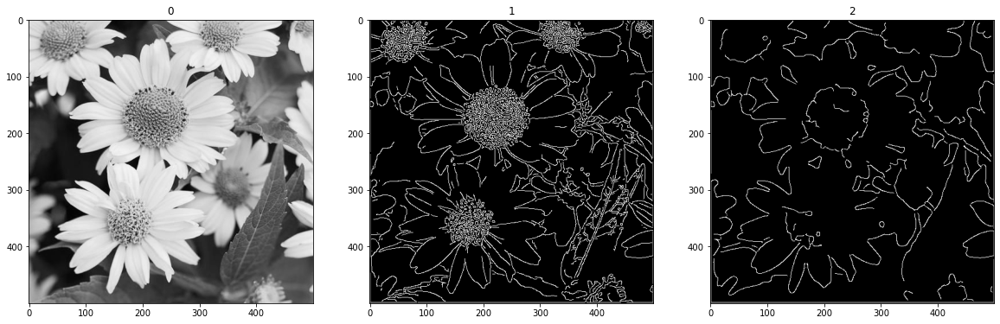

In [34]:
# Sigma help to remove the noisy image in edge detection
image_edges_01 = feature.canny(image_gray)
image_edges_02 = feature.canny(image_gray, sigma = 3)
showListImages([image_gray, image_edges_01, image_edges_02], 1, 3)